In [366]:
# Libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

## Standard plotly imports
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot
import cufflinks as cf
import plotly.figure_factory as ff

In [367]:
cf.go_offline()
# Set the global them 
cf.set_config_file(world_readable=True, theme='pearl', offline=True)

sns.set(style="darkgrid")

## Get Data

In [368]:
# Get data
df_test = pd.read_csv("../data/interim/test_cleaned.csv")
df_train = pd.read_csv("../data/interim/train_cleaned.csv")

## EDA

In [369]:

df_train['SalePrice'].iplot(kind='hist',
                            xTitle='Sale Price',
                            yTitle='count',
                            title='Sale Price Distribution'
                           )


###  Numeric Features

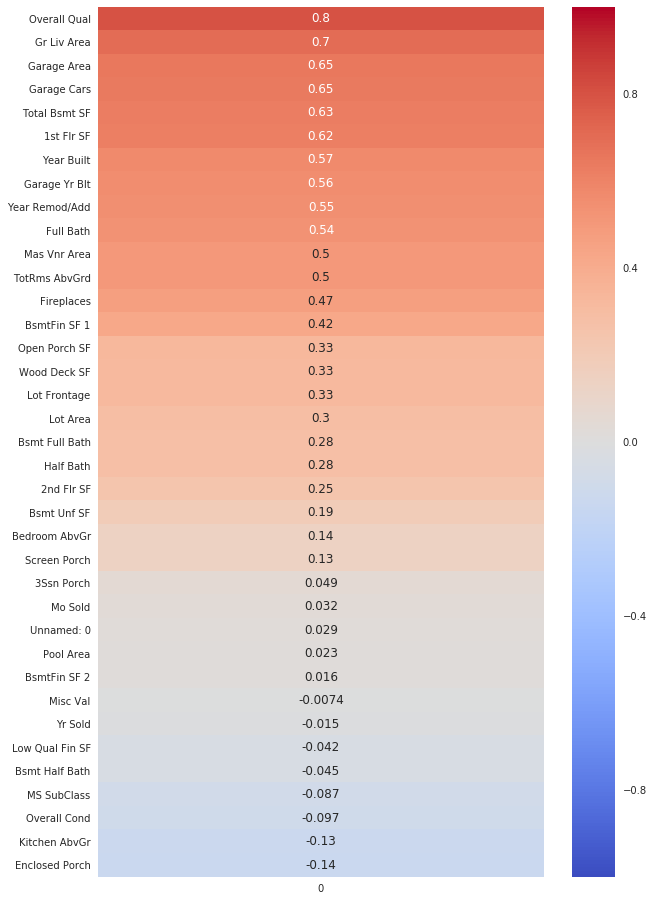

In [370]:
# Isolate correlation with respect to price (just numeric features)
corr_col = df_train.corrwith(df_train['SalePrice']).sort_values(ascending=False)[1:].to_frame()
fig2, ax2 = plt.subplots(figsize = (10,16))
corrplot = sns.heatmap(corr_col, cmap= 'coolwarm', annot=True, vmin=-1, vmax=1);


### Pair Plot for Highly Correlated 

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/numpy/lib/histograms.py:746: RuntimeWarning:

invalid value encountered in greater_equal

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/numpy/lib/histograms.py:747: RuntimeWarning:

invalid value encountered in less_equal



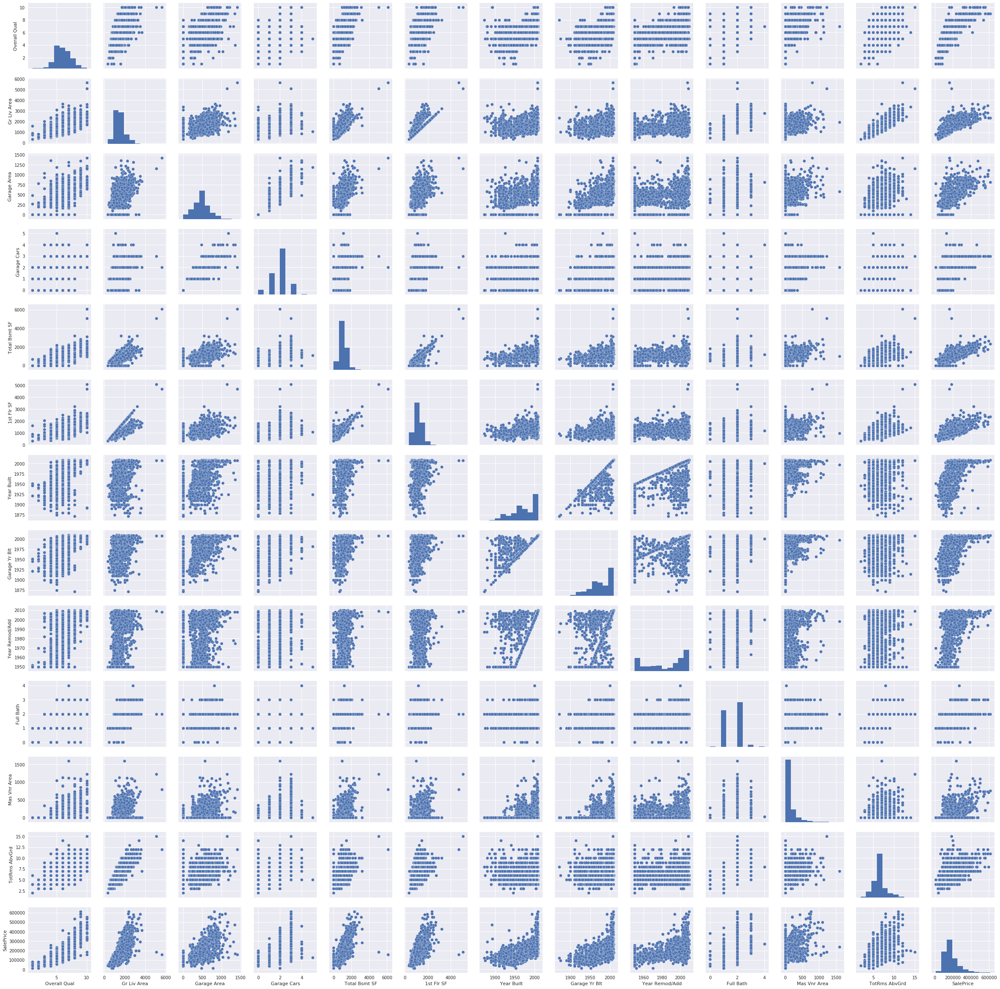

In [371]:
top_correlated = corr_col.loc[corr_col[0] > 0.5].index.tolist()
top_correlated.append('SalePrice')

sns.pairplot(df_train[top_correlated])

### Log Scale Price

In [372]:
# Make column of sale price on logrithmic scale
df_train['LogSalePrice'] = np.log1p(df_train['SalePrice'])

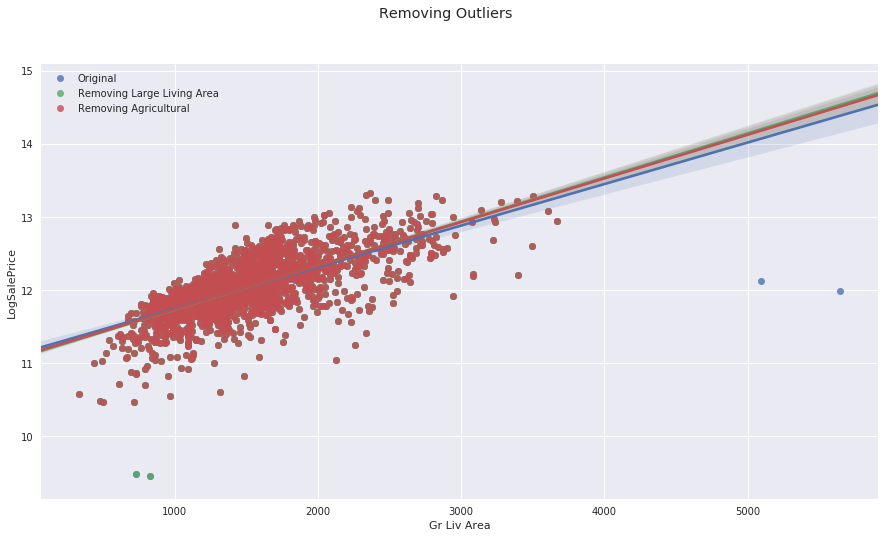

In [373]:
# Transform data on log scale

fig, ax = plt.subplots(figsize=(15,8),)
sns.regplot(x='Gr Liv Area', y='LogSalePrice', data=df_train, ax=ax,label='Original')
sns.regplot(x='Gr Liv Area', y='LogSalePrice', data=df_train[df_train['Gr Liv Area'] < 4000], 
            ax=ax,label='Removing Large Living Area')
sns.regplot(x='Gr Liv Area', 
            y='LogSalePrice',
            data=df_train[(df_train['Gr Liv Area'] < 4000) & (df_train['LogSalePrice'] > 10)], 
            ax=ax,label='Removing Agricultural')
ax.legend()
fig.suptitle('Removing Outliers');

In [374]:
df_train['LogSalePrice'].describe()

count    2049.000000
mean       12.024507
std         0.411013
min         9.456419
25%        11.774143
50%        11.998439
75%        12.273736
max        13.323929
Name: LogSalePrice, dtype: float64

### Gr Living Area

In [375]:
# Make column of sale price on logrithmic scale
df_train['LogGr Liv Area'] = np.log1p(df_train['Gr Liv Area'])

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6499: MatplotlibDeprecationWarning:


The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6499: MatplotlibDeprecationWarning:


The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6499: MatplotlibDeprecationWarning:


The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6499: MatplotlibDeprecationWarning:


The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6499: MatplotlibDeprecation

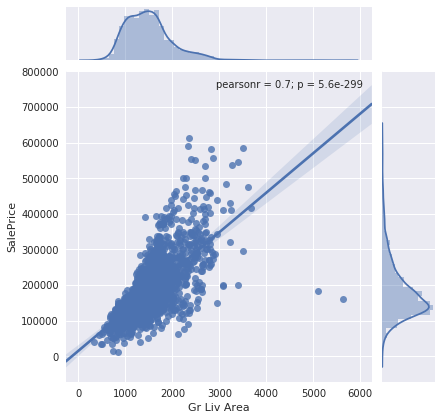

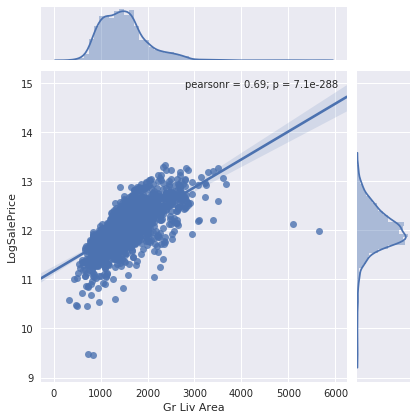

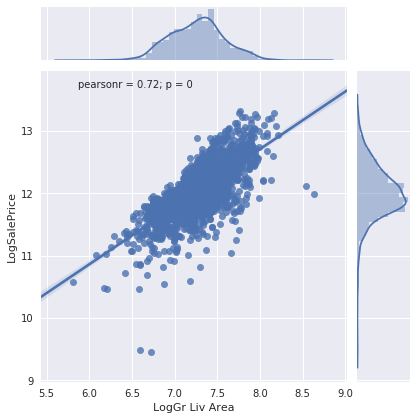

In [376]:
sns.jointplot(x='Gr Liv Area', y='SalePrice', data=df_train, kind='reg')
sns.jointplot(x='Gr Liv Area', y='LogSalePrice', data=df_train, kind='reg')
sns.jointplot(x='LogGr Liv Area', y='LogSalePrice', data=df_train, kind='reg')

### Overall Quality

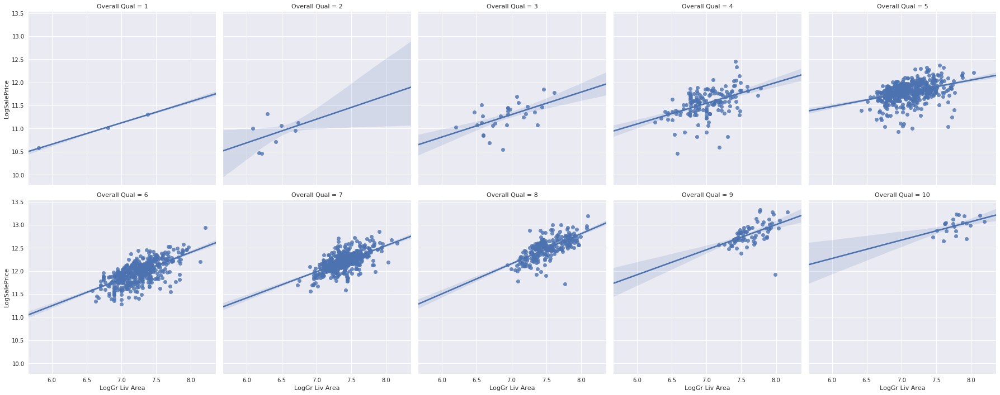

In [377]:
sns.lmplot(x='LogGr Liv Area', 
           y='LogSalePrice', 
           data=df_train[(df_train['Gr Liv Area'] < 4000) & (df_train['LogSalePrice'] > 10)], 
           col='Overall Qual',
           col_wrap=5, ci=80
          )

### Year and Remodeling

In [378]:
df_train['Age of Remodel'] = df_train['Yr Sold']-df_train['Year Remod/Add']

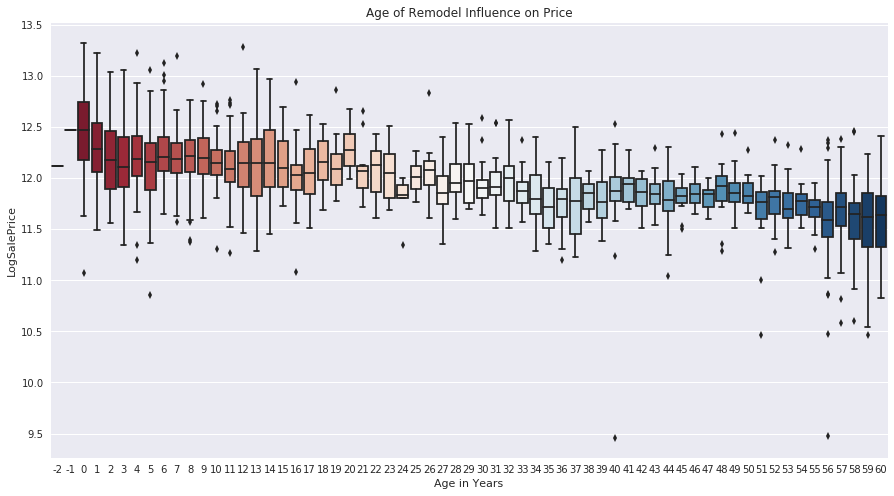

In [379]:
fig4, ax4 = plt.subplots(figsize=(15,8))
sns.boxplot(x='Age of Remodel',y='LogSalePrice', data = df_train, palette='RdBu')
plt.xlabel('Age in Years')
plt.title('Age of Remodel Influence on Price');

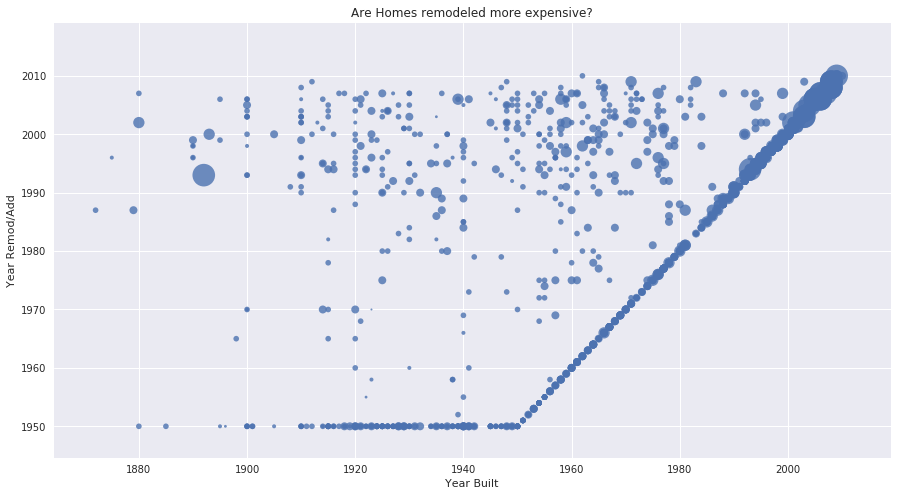

In [380]:
sizes = [ 4,8,16, 32,64, 128,512] 
marker_size = pd.cut(df_train['LogSalePrice'], [ 9,10, 11,11.5, 12,12.5, 13, 14], labels=sizes) 

fig3, ax3 = plt.subplots(figsize=(15,8))
fig3 = sns.regplot('Year Built','Year Remod/Add',  data=df_train, fit_reg=False, 
                   scatter_kws={'s':marker_size}, ax=ax3)
plt.title('Are Homes remodeled more expensive?');



## Categorical Features

In [381]:
# Make order numeric values for quality
ordered_rating_qual = { "NA": 0, "Po": 1, "Fa": 2, "TA": 3, "Gd": 4, "Ex": 5}

# Not all of them but only a select few columns I want to convert
qual_list = ['Exter Qual',
             'Exter Cond',
             'Bsmt Qual',
             'Kitchen Qual',
             'Fireplace Qu',
             'Garage Qual'
            ]

for col in qual_list:
    df_train[col] = df_train[col].map(ordered_rating_qual)

In [382]:
# MS SubClass was numeric but represents a categorical entry
df_train['MS SubClass'] = df_train['MS SubClass'].astype(str)

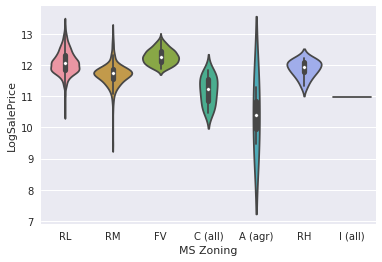

In [393]:
sns.violinplot(x='MS Zoning',y='LogSalePrice',data=df_train,);

In [383]:
# View counts by categories to see if there is enough 
df_train['MS Zoning'].value_counts()

RL         1597
RM          315
FV          101
C (all)      19
RH           14
A (agr)       2
I (all)       1
Name: MS Zoning, dtype: int64

### Neighborhood

In [427]:
df_train.groupby('Neighborhood')['Utilities'].count().sort_values(ascending=False).iplot(kind='bar',
                                                                                         xTitle='Neighborhood',
                                                                                         yTitle='Count',
                                                                                         title='Total Homes Sold'
                                                                                        )

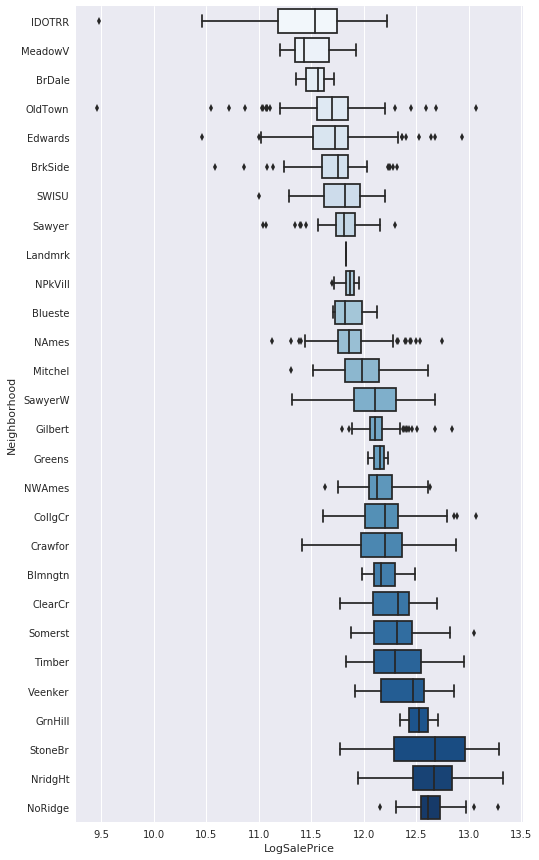

In [431]:
f399, ax399 = plt.subplots(figsize=(8,15))
sns.boxplot(y='Neighborhood',x='LogSalePrice',data=df_train, orient='h',
            order=df_train.groupby('Neighborhood')['LogSalePrice'].mean().sort_values().index.tolist(),
            palette = 'Blues', 
            ax=ax399
           );

In [384]:
# Just a reference list of items that didn't have enough split on categorcial info
skip_list = ['Street', 'Utilities', 'Heating', 'Misc Feature']

In [385]:
#Setup dummies on short list, doing all will not be helpful
dummy_list = ['MS Zoning',
              'MS SubClass',
              'Neighborhood',
              'Bldg Type',
              'House Style',
              'Roof Style',
              'Exterior 1st',
              'Exterior 2nd',
              'Foundation',
              'Functional',
              'Garage Type',
              'Garage Finish',
              'Paved Drive']

In [386]:
# Create dummies on train dataset
for col in dummy_list:
    dummy = pd.get_dummies(df_train[col], columns=col, prefix=col)
    df_train = pd.concat([df_train, dummy], axis=1)
    
df_train.head()

,Unnamed: 0,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,...,Garage Type_Basment,Garage Type_BuiltIn,Garage Type_CarPort,Garage Type_Detchd,Garage Finish_Fin,Garage Finish_RFn,Garage Finish_Unf,Paved Drive_N,Paved Drive_P,Paved Drive_Y
0,0,60,RL,69.1,13517,Pave,NaN,IR1,Lvl,AllPub,...,0,0,0,0,0,1,0,0,0,1
1,1,60,RL,43.0,11492,Pave,NaN,IR1,Lvl,AllPub,...,0,0,0,0,0,1,0,0,0,1
2,2,20,RL,68.0,7922,Pave,NaN,Reg,Lvl,AllPub,...,0,0,0,1,0,0,1,0,0,1
3,3,60,RL,73.0,9802,Pave,NaN,Reg,Lvl,AllPub,...,0,1,0,0,1,0,0,0,0,1
4,4,50,RL,82.0,14235,Pave,NaN,IR1,Lvl,AllPub,...,0,0,0,1,0,0,1,1,0,0


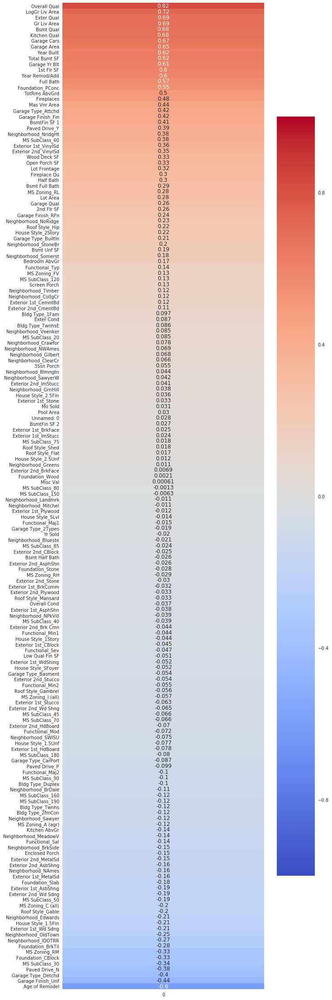

In [391]:
# Isolate correlation with respect to price (just numeric features)
corr_col_log = df_train.corrwith(df_train['LogSalePrice']).sort_values(ascending=False)[2:].to_frame()
fig20, ax20 = plt.subplots(figsize = (10,40))
corrplot_log = sns.heatmap(corr_col_log, cmap= 'coolwarm', annot=True, vmin=-1, vmax=1);